# Evaluate MQA performance

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
pd.options.display.float_format = '{:.3f}'.format
plt.rcParams["figure.dpi"] = 150
sns.set(style='darkgrid')
from IPython.display import display
import warnings
warnings.simplefilter('ignore', UserWarning)
from pathlib import Path
from sklearn.metrics import mean_absolute_error
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams["font.size"] = 15
plt.rcParams['figure.figsize'] = (6, 4)

In [2]:
data_dir = Path('../../../../../data/')
dataset_dir = data_dir / 'out' / 'dataset'
subset_name = 'target_subset_' + Path('.').resolve().parent.name
score_dir = dataset_dir / 'score' / 'subsets' / subset_name
assert score_dir.exists()
fig_dir = score_dir / 'fig' / 'MQA'
fig_dir.mkdir(parents=True, exist_ok=True)
target_list = data_dir / 'interim' / f'{subset_name}.csv'
assert target_list.exists()

In [3]:
label_path = score_dir / 'label.csv'
label_df = pd.read_csv(label_path, index_col=0)
target_df = pd.read_csv(target_list, index_col=0)
neff_df = pd.read_csv(score_dir / 'neff.csv', index_col=0)
label_df = pd.merge(label_df, target_df, left_on='Target', right_on='id', how='left')
label_df = pd.merge(label_df, neff_df, on='Target', how='left')
label_df.head()

,Model,TMscore,GDT_TS,GDT_HA,Global_LDDT,Mean_LDDT,pLDDT,pTMscore,Tolerance,ModelName,...,resolution,releasedate,header,sequence,length,num_entry_in_cluster,num_entry_in_cluster_AF2_notInclude,is_similar_AF2,Neff,NumMSA
0,model_1_ptm_seed_0_rec_10_ens_1,0.981,0.980,0.919,0.910,0.901,0.955,0.900,0.032,model_1_ptm,...,1.470,2019-04-17T00:00:00Z,>6an4_A mol:protein length:158 2-amino-4-hydr...,TVAYIAIGSNLASPLEQVNAALKALGDIPESHILTVSSFYRTPPLG...,158,90,5,True,9570,15080
1,model_1_ptm_seed_0_rec_10_ens_8,0.981,0.979,0.916,0.910,0.901,0.956,0.901,0.019,model_1_ptm,...,1.470,2019-04-17T00:00:00Z,>6an4_A mol:protein length:158 2-amino-4-hydr...,TVAYIAIGSNLASPLEQVNAALKALGDIPESHILTVSSFYRTPPLG...,158,90,5,True,9570,15080
2,model_1_ptm_seed_0_rec_1_ens_1,0.981,0.980,0.917,0.909,0.901,0.944,0.895,20.749,model_1_ptm,...,1.470,2019-04-17T00:00:00Z,>6an4_A mol:protein length:158 2-amino-4-hydr...,TVAYIAIGSNLASPLEQVNAALKALGDIPESHILTVSSFYRTPPLG...,158,90,5,True,9570,15080
3,model_1_ptm_seed_0_rec_1_ens_8,0.980,0.979,0.917,0.910,0.901,0.947,0.896,20.749,model_1_ptm,...,1.470,2019-04-17T00:00:00Z,>6an4_A mol:protein length:158 2-amino-4-hydr...,TVAYIAIGSNLASPLEQVNAALKALGDIPESHILTVSSFYRTPPLG...,158,90,5,True,9570,15080
4,model_1_ptm_seed_0_rec_2_ens_1,0.981,0.979,0.919,0.911,0.903,0.948,0.897,0.172,model_1_ptm,...,1.470,2019-04-17T00:00:00Z,>6an4_A mol:protein length:158 2-amino-4-hydr...,TVAYIAIGSNLASPLEQVNAALKALGDIPESHILTVSSFYRTPPLG...,158,90,5,True,9570,15080


In [4]:
for i, csv in enumerate(sorted(score_dir.glob('*.csv'))):
    if csv.stem == 'label' or csv.stem == 'all_score' or csv.stem.startswith('mqa') or csv.stem == 'neff':
        continue
    if i == 0:
        mqa_df = pd.read_csv(csv, index_col=0)
    else:
        mqa_df = pd.merge(mqa_df, pd.read_csv(csv, index_col=0), on=['Model', 'Target'], how='outer')
mqa_df['DOPE'] = - mqa_df['DOPE']
mqa_df['SOAP'] = - mqa_df['SOAP']
mqa_df

,Model,DOPE,SOAP,Target,DeepAccNet,DeepAccNet-Bert,P3CMQA,ProQ2D,ProQRosCenD,ProQRosFAD,ProQ3D,SBROD,VoroCNN
0,model_1_ptm_seed_0_rec_10_ens_1,19389.191,123028.594,6AN4_A,0.994,0.891,0.973,0.821,0.806,0.967,0.895,1.505,0.686
1,model_1_ptm_seed_0_rec_10_ens_8,19369.781,123495.156,6AN4_A,0.995,0.955,0.972,0.823,0.805,0.966,0.894,1.507,0.687
2,model_1_ptm_seed_0_rec_1_ens_1,19393.094,120974.703,6AN4_A,0.990,0.894,0.977,0.822,0.803,0.961,0.891,1.515,0.687
3,model_1_ptm_seed_0_rec_1_ens_8,19425.303,120961.469,6AN4_A,0.993,0.878,0.977,0.828,0.805,0.966,0.892,1.514,0.684
4,model_1_ptm_seed_0_rec_2_ens_1,19332.221,121001.195,6AN4_A,0.989,0.866,0.973,0.816,0.793,0.963,0.888,1.513,0.679
...,...,...,...,...,...,...,...,...,...,...,...,...,...
108595,model_5_seed_1_rec_7_ens_8,8525.065,53667.109,6Y24_A,0.854,0.792,0.674,0.584,0.654,0.871,0.730,1.481,0.633
108596,model_5_seed_1_rec_8_ens_1,8491.236,52914.828,6Y24_A,0.835,0.792,0.653,0.556,0.633,0.853,0.707,1.481,0.629
108597,model_5_seed_1_rec_8_ens_8,8515.636,53587.473,6Y24_A,0.843,0.787,0.650,0.554,0.621,0.862,0.723,1.478,0.631
108598,model_5_seed_1_rec_9_ens_1,8554.831,52835.391,6Y24_A,0.844,0.791,0.654,0.589,0.665,0.871,0.721,1.477,0.631


In [5]:
label_df.columns

Index(['Model', 'TMscore', 'GDT_TS', 'GDT_HA', 'Global_LDDT', 'Mean_LDDT',
       'pLDDT', 'pTMscore', 'Tolerance', 'ModelName', 'Seed', 'Recycle',
       'Ensemble', 'Target', 'Num_diff', 'Num_missing', 'Length', 'id',
       'resolution', 'releasedate', 'header', 'sequence', 'length',
       'num_entry_in_cluster', 'num_entry_in_cluster_AF2_notInclude',
       'is_similar_AF2', 'Neff', 'NumMSA'],
      dtype='object')

In [6]:
df = pd.merge(label_df, mqa_df, on=['Target', 'Model'], how='left')
df_output_path = score_dir / 'all_score.csv.gz'
save_df = df.drop(['header', 'sequence'], axis=1)
save_df.to_csv(df_output_path, compression='gzip')
df

,Model,TMscore,GDT_TS,GDT_HA,Global_LDDT,Mean_LDDT,pLDDT,pTMscore,Tolerance,ModelName,...,SOAP,DeepAccNet,DeepAccNet-Bert,P3CMQA,ProQ2D,ProQRosCenD,ProQRosFAD,ProQ3D,SBROD,VoroCNN
0,model_1_ptm_seed_0_rec_10_ens_1,0.981,0.980,0.919,0.910,0.901,0.955,0.900,0.032,model_1_ptm,...,123028.594,0.994,0.891,0.973,0.821,0.806,0.967,0.895,1.505,0.686
1,model_1_ptm_seed_0_rec_10_ens_8,0.981,0.979,0.916,0.910,0.901,0.956,0.901,0.019,model_1_ptm,...,123495.156,0.995,0.955,0.972,0.823,0.805,0.966,0.894,1.507,0.687
2,model_1_ptm_seed_0_rec_1_ens_1,0.981,0.980,0.917,0.909,0.901,0.944,0.895,20.749,model_1_ptm,...,120974.703,0.990,0.894,0.977,0.822,0.803,0.961,0.891,1.515,0.687
3,model_1_ptm_seed_0_rec_1_ens_8,0.980,0.979,0.917,0.910,0.901,0.947,0.896,20.749,model_1_ptm,...,120961.469,0.993,0.878,0.977,0.828,0.805,0.966,0.892,1.514,0.684
4,model_1_ptm_seed_0_rec_2_ens_1,0.981,0.979,0.919,0.911,0.903,0.948,0.897,0.172,model_1_ptm,...,121001.195,0.989,0.866,0.973,0.816,0.793,0.963,0.888,1.513,0.679
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108595,model_5_seed_1_rec_7_ens_8,0.960,0.981,0.887,0.909,0.907,0.875,NaN,0.627,model_5,...,53667.109,0.854,0.792,0.674,0.584,0.654,0.871,0.730,1.481,0.633
108596,model_5_seed_1_rec_8_ens_1,0.960,0.981,0.887,0.910,0.907,0.876,NaN,0.339,model_5,...,52914.828,0.835,0.792,0.653,0.556,0.633,0.853,0.707,1.481,0.629
108597,model_5_seed_1_rec_8_ens_8,0.960,0.981,0.884,0.909,0.907,0.875,NaN,0.426,model_5,...,53587.473,0.843,0.787,0.650,0.554,0.621,0.862,0.723,1.478,0.631
108598,model_5_seed_1_rec_9_ens_1,0.959,0.981,0.887,0.908,0.906,0.876,NaN,0.492,model_5,...,52835.391,0.844,0.791,0.654,0.589,0.665,0.871,0.721,1.477,0.631


In [7]:
import sys
sys.path.append('../../../../mqa')
from eval import eval, stat_test, eval_get_df

In [8]:
mqa_df.columns

Index(['Model', 'DOPE', 'SOAP', 'Target', 'DeepAccNet', 'DeepAccNet-Bert',
       'P3CMQA', 'ProQ2D', 'ProQRosCenD', 'ProQRosFAD', 'ProQ3D', 'SBROD',
       'VoroCNN'],
      dtype='object')

## Evaluate MQA peformance per target

### For GDT_TS

In [9]:
# Against gdtts
mqa_methods = ['DOPE', 'SOAP', 'ProQ3D', 'SBROD', 'VoroCNN', 'P3CMQA', 'DeepAccNet', 'DeepAccNet-Bert']
methods = mqa_methods + ['pLDDT', 'pTMscore']
label = 'GDT_TS'
data = df
result_df = eval(data, methods, label_name=label)
result_df

300


,Method,GDT_TS Pearson,GDT_TS Spearman,GDT_TS Loss,GDT_TS MAE
0,DOPE,0.163,0.135,2.370,NaN
1,SOAP,0.156,0.139,2.540,NaN
2,ProQ3D,0.077,0.060,2.603,0.161
3,SBROD,0.018,0.014,3.000,NaN
4,VoroCNN,0.059,0.049,2.847,0.256
5,P3CMQA,0.141,0.120,2.443,0.122
6,DeepAccNet,0.129,0.096,2.355,0.076
7,DeepAccNet-Bert,0.097,0.078,2.451,0.088
8,pLDDT,0.252,0.205,1.919,0.056
9,pTMscore,0.241,0.201,2.050,0.077


In [10]:
methods

['DOPE',
 'SOAP',
 'ProQ3D',
 'SBROD',
 'VoroCNN',
 'P3CMQA',
 'DeepAccNet',
 'DeepAccNet-Bert',
 'pLDDT',
 'pTMscore']

In [11]:
# Against gdtts (For targets whose value difference between max and min is larger than 0.05)
label = 'GDT_TS'
data = df.groupby('Target').filter(lambda x: x[label].max() - x[label].min() > 0.05)
result_df = eval(data, methods, label_name=label)
result_df

121


,Method,GDT_TS Pearson,GDT_TS Spearman,GDT_TS Loss,GDT_TS MAE
0,DOPE,0.230,0.191,4.247,NaN
1,SOAP,0.217,0.196,4.626,NaN
2,ProQ3D,0.150,0.113,4.813,0.156
3,SBROD,0.065,0.054,5.584,NaN
4,VoroCNN,0.087,0.072,5.286,0.210
5,P3CMQA,0.184,0.158,4.440,0.132
6,DeepAccNet,0.243,0.187,4.158,0.109
7,DeepAccNet-Bert,0.166,0.135,4.398,0.125
8,pLDDT,0.323,0.252,3.393,0.075
9,pTMscore,0.320,0.251,3.539,0.076


In [12]:
# Against gdtts
mqa_methods = ['DOPE', 'SOAP', 'ProQ3D', 'SBROD', 'VoroCNN', 'P3CMQA', 'DeepAccNet', 'DeepAccNet-Bert']
methods = mqa_methods + ['pLDDT', 'pTMscore']
label = 'GDT_TS'
data = df.groupby('Target').filter(lambda x: x[label].max() - x[label].min() > 0.05)
result_each_target = eval_get_df(data, methods, label_name=label)
def get_whole_result_from_each_target(result_each_target, columns):
    result_df = result_each_target.groupby('Method').mean().reset_index()
    order_dict = dict(zip(columns, range(len(columns))))
    result_df['order'] = result_df['Method'].apply(lambda x: order_dict[x])
    result_df = result_df.sort_values('order')
    result_df = result_df.set_index('Method')
    result_df = result_df.reset_index().drop('order', axis=1)
    return result_df
result_df = get_whole_result_from_each_target(result_each_target, methods + ['Random selection'])
result_each_target = pd.merge(result_each_target, target_df, left_on='Target', right_on='id', how='left')
result_each_target.to_csv(score_dir / 'mqa_result_each_target_gdtts_5.csv')
result_df

121


,Method,GDT_TS Pearson,GDT_TS Spearman,GDT_TS Loss,GDT_TS MAE
0,DOPE,0.230,0.191,4.247,NaN
1,SOAP,0.217,0.196,4.626,NaN
2,ProQ3D,0.150,0.113,4.813,0.156
3,SBROD,0.065,0.054,5.584,NaN
4,VoroCNN,0.087,0.072,5.286,0.210
5,P3CMQA,0.184,0.158,4.440,0.132
6,DeepAccNet,0.243,0.187,4.158,0.109
7,DeepAccNet-Bert,0.166,0.135,4.398,0.125
8,pLDDT,0.323,0.252,3.393,0.075
9,pTMscore,0.320,0.251,3.539,0.076


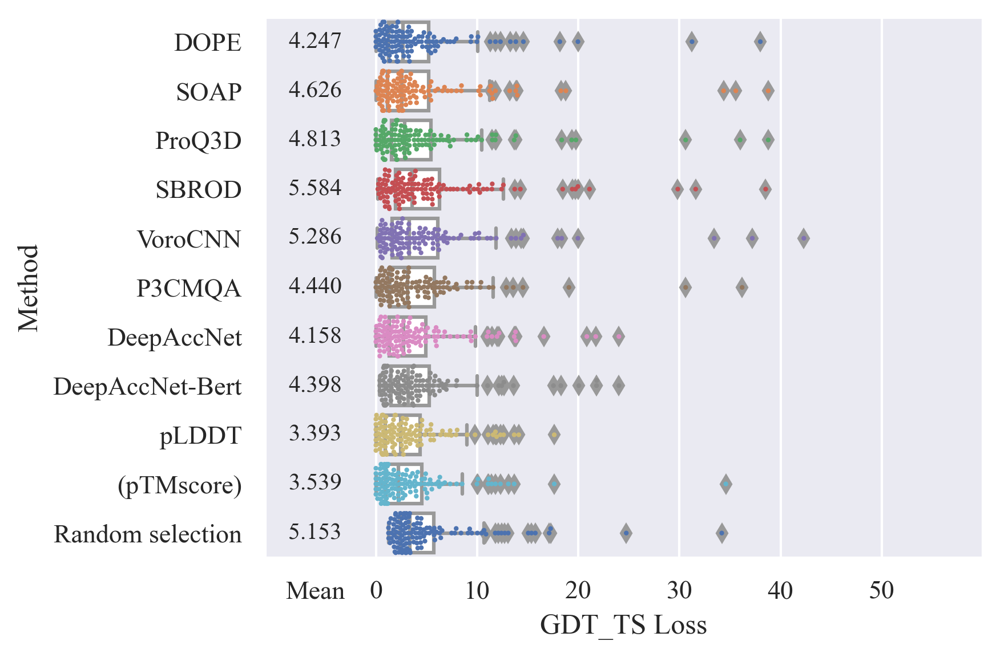

In [13]:
plt.rcParams['font.family'] = 'Times New Roman'
label = 'GDT_TS'
metric = 'Loss'
sns.boxplot(data=result_each_target, x=f'{label} {metric}', y=f'Method', order=methods + ['Random selection'], color='white')
sns.swarmplot(data=result_each_target, x=f'{label} {metric}', y=f'Method', order=methods + ['Random selection'], size=2, palette='deep')
xticks = np.arange(-1, 6) * 10
xticks_start = -6
xticks[0] = xticks_start
xticks_str = xticks.astype(str)
xticks_str[0] = 'Mean'
plt.xlim(-11, 60)
plt.xticks(xticks, xticks_str)
plt.axvline(x=xticks_start, color=(234/255,234/255,242/255))
# put parentheses around the pTMscore
yticks, yticks_texts = plt.yticks()
for i, ytick_text in enumerate(yticks_texts):
    if ytick_text.get_text() == 'pTMscore':
        yticks_texts[i] = '(pTMscore)'
plt.yticks(yticks, yticks_texts)
for i, method in enumerate(methods + ['Random selection']):
    value = result_df.query('Method == @method')[f'{label} {metric}'].values[0]
    plt.text(xticks_start, i, f'{value:.3f}', size=10, horizontalalignment='center', verticalalignment='center')
plt.tight_layout()
plt.savefig(fig_dir / f'boxplot_{label}_{metric}.png')
plt.show()

In [14]:
result_each_target.query('Method == "Random selection"')[['Target', 'GDT_TS Loss']].sort_values('GDT_TS Loss')

,Target,GDT_TS Loss
1224,6DHP_u,1.245
1276,6PO0_A,1.245
1297,6W3G_A,1.259
1304,6XOD_A,1.320
1307,6YA1_A,1.393
...,...,...
1236,6G45_A,15.761
1237,6GT9_A,17.124
1328,7LJ5_A,17.268
1229,6EXU_A,24.751


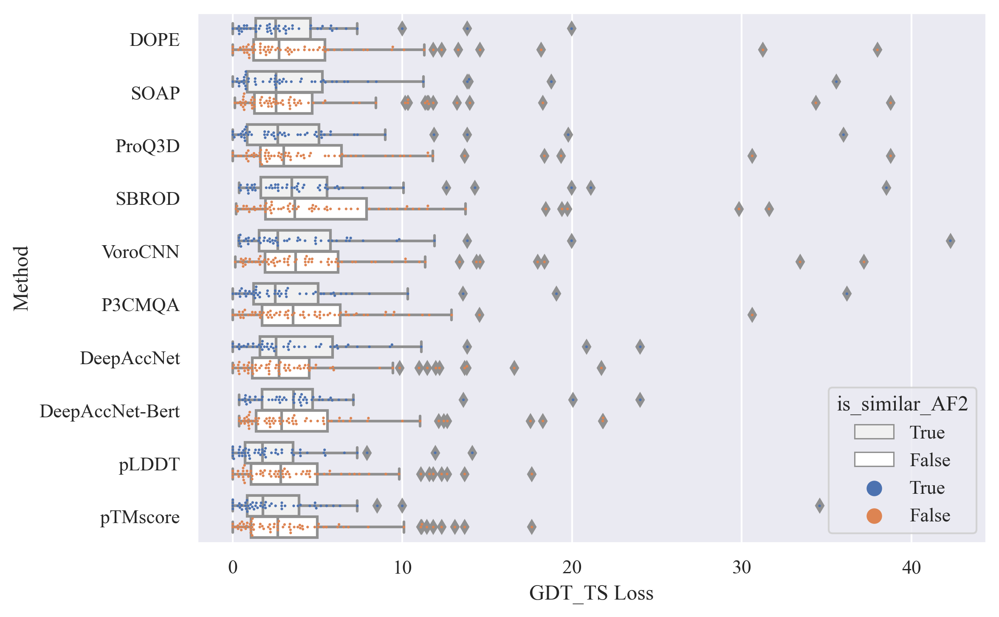

In [15]:
label = 'GDT_TS'
metric = 'Loss'
plt.figure(figsize=(8, 5))
order = [True, False]
sns.boxplot(data=result_each_target, x=f'{label} {metric}', y=f'Method', order=methods, hue='is_similar_AF2', color='white', hue_order=order)
sns.swarmplot(data=result_each_target, x=f'{label} {metric}', y=f'Method', order=methods, size=1.5, hue='is_similar_AF2', dodge=True, hue_order=order)
plt.tight_layout()
plt.savefig(fig_dir / f'boxplot_{label}_{metric}_similar_af2.png')
plt.show()

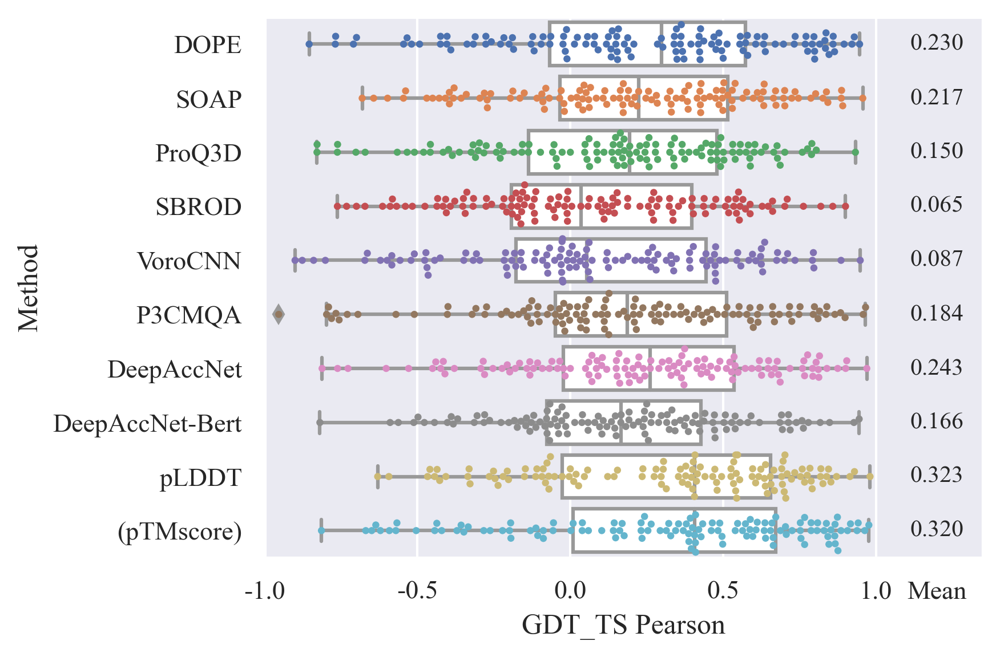

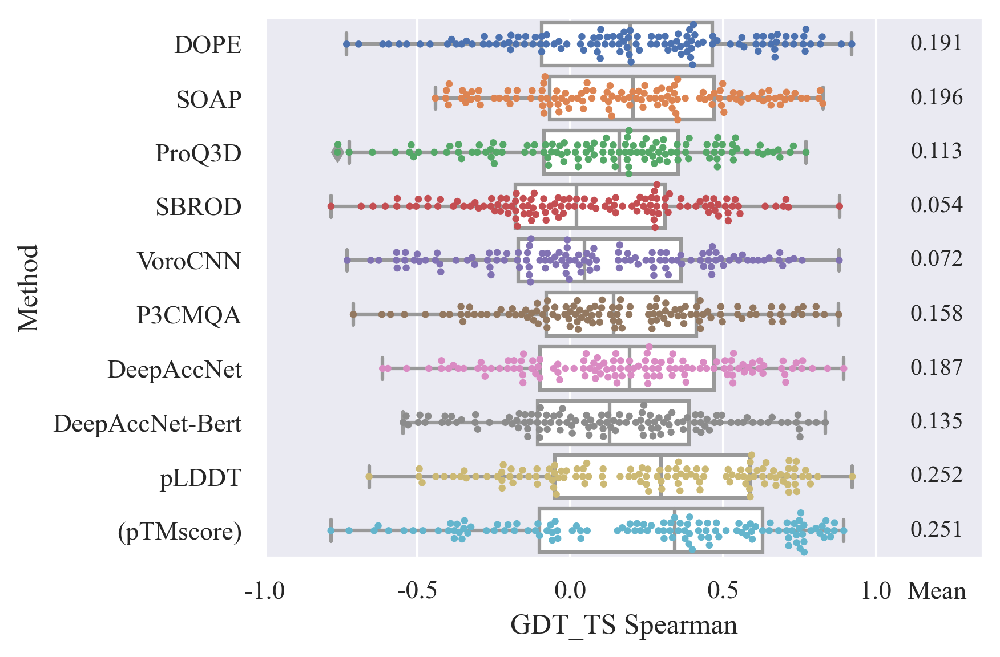

In [16]:
metrics = ['Pearson', 'Spearman']
data = result_each_target
label = 'GDT_TS'
y = 'Method'
for metric in metrics:
    x = f'{label} {metric}'
    sns.boxplot(data=data, x=x, y=y, order=methods, color='white')
    sns.swarmplot(data=data, x=x, y=y, order=methods, size=3)
    xticks_max = 1.2
    plt.xlim(-1, 1.35)
    xticks = np.append(np.arange(-1.0, 1.2, 0.5), [xticks_max])
    xticks_str = list(map(lambda x: f'{x:.1f}', xticks))
    xticks_str[-1] = 'Mean'
    plt.xticks(xticks, xticks_str)
    # put parentheses around the pTMscore
    yticks, yticks_texts = plt.yticks()
    for i, ytick_text in enumerate(yticks_texts):
        if ytick_text.get_text() == 'pTMscore':
            yticks_texts[i] = '(pTMscore)'
    plt.yticks(yticks, yticks_texts)
    plt.axvline(x=xticks_max, color=(234/255,234/255,242/255))
    mean_series = data.groupby(y).mean()[x]
    for i, method in enumerate(methods):
        value = mean_series[method]
        plt.text(xticks_max, i, f'{value:.3f}', size=10, horizontalalignment='center', verticalalignment='center')
    plt.tight_layout()
    plt.savefig(fig_dir / f'boxplot_{label}_{metric}.png')
    plt.show()

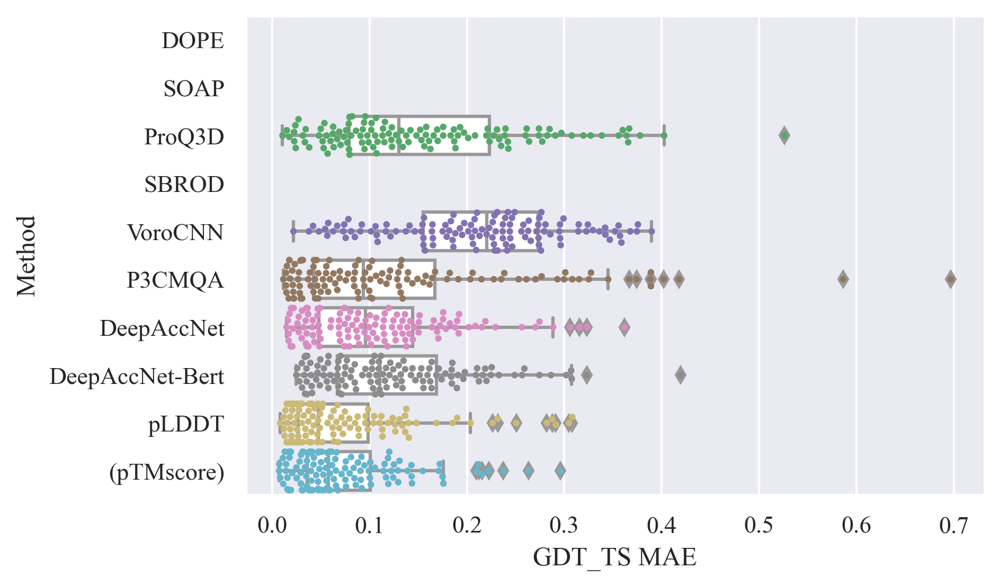

In [17]:
label = 'GDT_TS'
metric = 'MAE'
x = f'{label} {metric}'
sns.boxplot(data=data, x=x, y=y, order=methods, color='white')
sns.swarmplot(data=data, x=x, y=y, order=methods, size=3)
# put parentheses around the pTMscore
yticks, yticks_texts = plt.yticks()
for i, ytick_text in enumerate(yticks_texts):
    if ytick_text.get_text() == 'pTMscore':
        yticks_texts[i] = '(pTMscore)'
plt.yticks(yticks, yticks_texts)
plt.show()

### For models with pTMscore

In [18]:
# Against gdtts (For models by ptm models)
mqa_methods = ['DOPE', 'SOAP', 'ProQ3D', 'SBROD', 'VoroCNN', 'P3CMQA', 'DeepAccNet', 'DeepAccNet-Bert']
methods = mqa_methods + ['pLDDT', 'pTMscore']
label = 'GDT_TS'
data = df[~df['pTMscore'].isna()].groupby('Target').filter(lambda x: x[label].max() - x[label].min() > 0.05)
result_each_target_ptm = eval_get_df(data, methods, label_name=label)
result_df_ptm = get_whole_result_from_each_target(result_each_target_ptm, methods + ['Random selection'])
result_each_target_ptm = pd.merge(result_each_target_ptm, target_df, left_on='Target', right_on='id', how='left')
result_each_target_ptm.to_csv(score_dir / 'mqa_result_each_target_gdtts_5_with_ptm.csv')
result_df_ptm

108


,Method,GDT_TS Pearson,GDT_TS Spearman,GDT_TS Loss,GDT_TS MAE
0,DOPE,0.269,0.236,3.948,NaN
1,SOAP,0.234,0.218,4.529,NaN
2,ProQ3D,0.144,0.108,4.939,0.159
3,SBROD,0.090,0.087,5.056,NaN
4,VoroCNN,0.110,0.103,4.595,0.212
5,P3CMQA,0.195,0.174,3.987,0.139
6,DeepAccNet,0.253,0.190,3.985,0.110
7,DeepAccNet-Bert,0.189,0.146,4.278,0.128
8,pLDDT,0.343,0.264,3.344,0.075
9,pTMscore,0.343,0.269,2.998,0.077


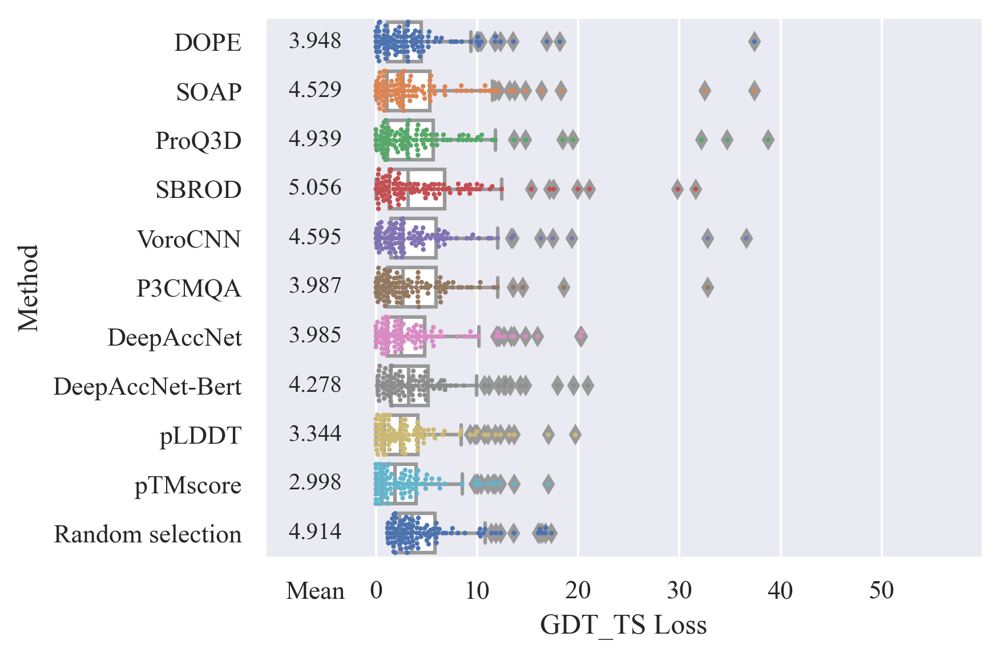

In [19]:
# Against gdtts (For models by ptm models)
label = 'GDT_TS'
metric = 'Loss'
sns.boxplot(data=result_each_target_ptm, x=f'{label} {metric}', y=f'Method', order=methods + ['Random selection'], color='white')
sns.swarmplot(data=result_each_target_ptm, x=f'{label} {metric}', y=f'Method', order=methods + ['Random selection'], size=2, palette='deep')
xticks = np.arange(-1, 6) * 10
xticks_start = -6
xticks[0] = xticks_start
xticks_str = xticks.astype(str)
xticks_str[0] = 'Mean'
plt.xlim(-11, 60)
plt.xticks(xticks, xticks_str)
plt.axvline(x=xticks_start, color=(234/255,234/255,242/255))
for i, method in enumerate(methods + ['Random selection']):
    value = result_df_ptm.query('Method == @method')[f'{label} {metric}'].values[0]
    plt.text(xticks_start, i, f'{value:.3f}', size=10, horizontalalignment='center', verticalalignment='center')
plt.tight_layout()
plt.savefig(fig_dir / f'boxplot_{label}_{metric}_with_ptm.png')

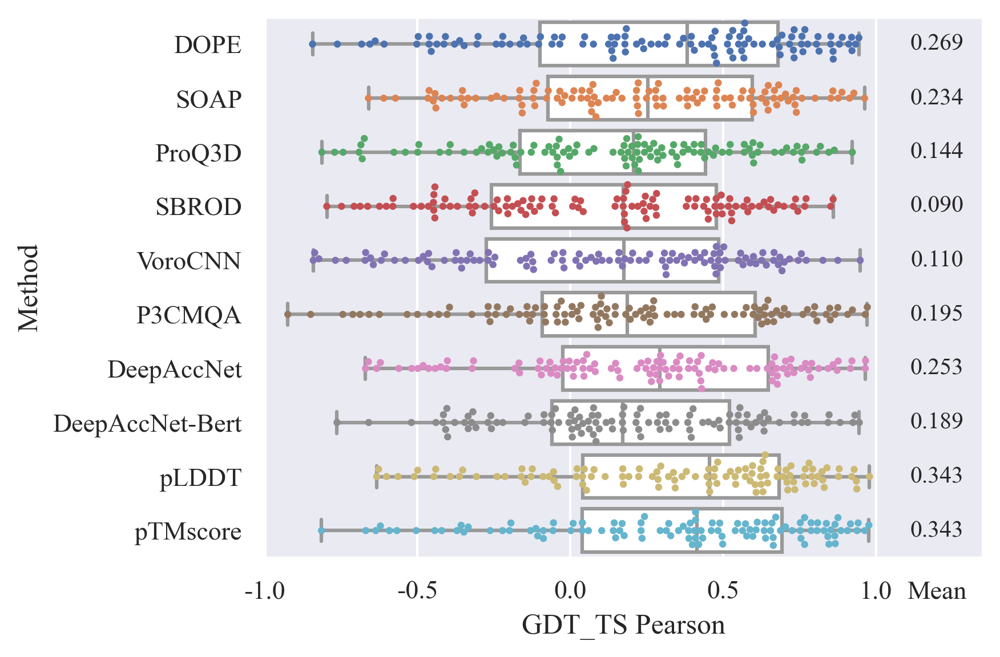

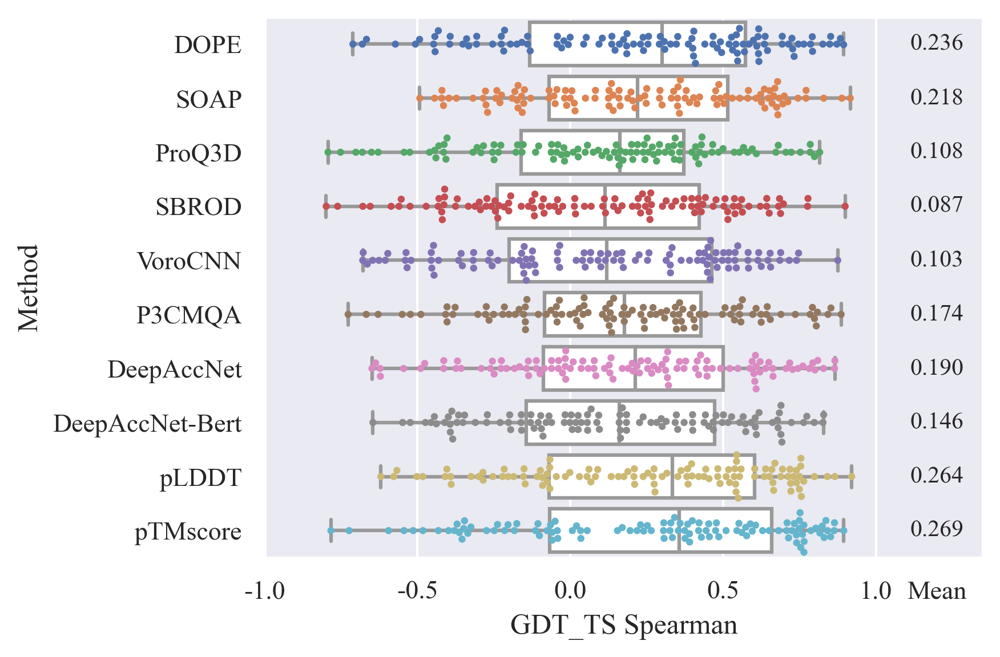

In [20]:
metrics = ['Pearson', 'Spearman']
data = result_each_target_ptm
label = 'GDT_TS'
y = 'Method'
for metric in metrics:
    x = f'{label} {metric}'
    sns.boxplot(data=data, x=x, y=y, order=methods, color='white')
    sns.swarmplot(data=data, x=x, y=y, order=methods, size=3)
    xticks_max = 1.2
    plt.xlim(-1, 1.35)
    xticks = np.append(np.arange(-1.0, 1.2, 0.5), [xticks_max])
    xticks_str = list(map(lambda x: f'{x:.1f}', xticks))
    xticks_str[-1] = 'Mean'
    plt.xticks(xticks, xticks_str)
    plt.axvline(x=xticks_max, color=(234/255,234/255,242/255))
    mean_series = data.groupby(y).mean()[x]
    for i, method in enumerate(methods):
        value = mean_series[method]
        plt.text(xticks_max, i, f'{value:.3f}', size=10, horizontalalignment='center', verticalalignment='center')
    plt.tight_layout()
    plt.savefig(fig_dir / f'boxplot_{label}_{metric}_ptm.png')
    plt.show()

### MQA performance difference between is_similar_AF2

In [21]:
# Against gdtts
label = 'GDT_TS'
for name, group in df.groupby('is_similar_AF2'):
    print(name)
    data = group
    result_df = eval(data, methods, label_name=label)
    display(result_df)

False
150


,Method,GDT_TS Pearson,GDT_TS Spearman,GDT_TS Loss,GDT_TS MAE
0,DOPE,0.168,0.124,2.955,NaN
1,SOAP,0.167,0.131,2.968,NaN
2,ProQ3D,0.114,0.075,3.139,0.156
3,SBROD,0.057,0.043,3.502,NaN
4,VoroCNN,0.104,0.074,3.366,0.249
5,P3CMQA,0.141,0.110,2.918,0.163
6,DeepAccNet,0.229,0.178,2.512,0.081
7,DeepAccNet-Bert,0.142,0.114,2.867,0.095
8,pLDDT,0.258,0.189,2.420,0.060
9,pTMscore,0.200,0.145,2.512,0.077


True
150


,Method,GDT_TS Pearson,GDT_TS Spearman,GDT_TS Loss,GDT_TS MAE
0,DOPE,0.158,0.146,1.785,NaN
1,SOAP,0.145,0.147,2.112,NaN
2,ProQ3D,0.041,0.044,2.067,0.165
3,SBROD,-0.021,-0.015,2.498,NaN
4,VoroCNN,0.014,0.023,2.328,0.263
5,P3CMQA,0.142,0.129,1.967,0.082
6,DeepAccNet,0.030,0.015,2.198,0.070
7,DeepAccNet-Bert,0.052,0.042,2.034,0.081
8,pLDDT,0.247,0.221,1.418,0.051
9,pTMscore,0.281,0.257,1.588,0.077


In [22]:
# Against gdtts (For targets whose value difference between max and min is larger than 0.05)
label = 'GDT_TS'
for name, group in df.groupby('is_similar_AF2'):
    print(name)
    data = group.groupby('Target').filter(lambda x: x[label].max() - x[label].min() > 0.05)
    result_df = eval(data, methods, label_name=label)
    display(result_df)

False
70


,Method,GDT_TS Pearson,GDT_TS Spearman,GDT_TS Loss,GDT_TS MAE
0,DOPE,0.307,0.230,4.851,NaN
1,SOAP,0.291,0.231,4.844,NaN
2,ProQ3D,0.245,0.171,5.245,0.148
3,SBROD,0.093,0.069,5.879,NaN
4,VoroCNN,0.158,0.116,5.654,0.207
5,P3CMQA,0.202,0.159,4.703,0.165
6,DeepAccNet,0.331,0.235,4.033,0.114
7,DeepAccNet-Bert,0.239,0.177,4.560,0.132
8,pLDDT,0.366,0.266,3.943,0.080
9,pTMscore,0.357,0.259,3.827,0.083


True
51


,Method,GDT_TS Pearson,GDT_TS Spearman,GDT_TS Loss,GDT_TS MAE
0,DOPE,0.125,0.137,3.417,NaN
1,SOAP,0.115,0.148,4.327,NaN
2,ProQ3D,0.019,0.033,4.220,0.166
3,SBROD,0.026,0.033,5.178,NaN
4,VoroCNN,-0.011,0.012,4.781,0.215
5,P3CMQA,0.160,0.156,4.080,0.087
6,DeepAccNet,0.121,0.120,4.328,0.103
7,DeepAccNet-Bert,0.065,0.076,4.174,0.116
8,pLDDT,0.263,0.232,2.638,0.068
9,pTMscore,0.270,0.241,3.144,0.066


In [23]:
# Against mean lddt
label = 'Mean_LDDT'
data = df
result_df = eval(data, methods, label_name=label)
result_df

271


,Method,Mean_LDDT Pearson,Mean_LDDT Spearman,Mean_LDDT Loss,Mean_LDDT MAE
0,DOPE,0.316,0.276,1.167,NaN
1,SOAP,0.275,0.253,1.271,NaN
2,ProQ3D,0.118,0.096,1.395,0.114
3,SBROD,-0.005,-0.019,1.989,NaN
4,VoroCNN,0.095,0.078,1.600,0.211
5,P3CMQA,0.184,0.160,1.327,0.092
6,DeepAccNet,0.186,0.155,1.247,0.081
7,DeepAccNet-Bert,0.170,0.151,1.381,0.087
8,pLDDT,0.376,0.326,0.980,0.047
9,pTMscore,0.373,0.338,1.057,0.047


In [24]:
# Against mean lddt (For targets whose value difference between max and min is larger than 0.05)
label = 'Mean_LDDT'
data = df.groupby('Target').filter(lambda x: x[label].max() - x[label].min() > 0.05)
result_df = eval(data, methods, label_name=label)
result_df

63


,Method,Mean_LDDT Pearson,Mean_LDDT Spearman,Mean_LDDT Loss,Mean_LDDT MAE
0,DOPE,0.501,0.416,2.041,NaN
1,SOAP,0.435,0.367,2.610,NaN
2,ProQ3D,0.317,0.242,2.463,0.123
3,SBROD,0.129,0.091,4.422,NaN
4,VoroCNN,0.251,0.202,3.159,0.178
5,P3CMQA,0.307,0.252,2.644,0.128
6,DeepAccNet,0.499,0.420,1.800,0.082
7,DeepAccNet-Bert,0.367,0.336,2.474,0.096
8,pLDDT,0.608,0.514,1.531,0.053
9,pTMscore,0.567,0.492,1.717,0.070


In [25]:
# Against mean LDDT
label = 'Mean_LDDT'
for name, group in df.groupby('is_similar_AF2'):
    print(name)
    data = group
    result_df = eval(data, methods, label_name=label)
    display(result_df)

False
131


,Method,Mean_LDDT Pearson,Mean_LDDT Spearman,Mean_LDDT Loss,Mean_LDDT MAE
0,DOPE,0.314,0.261,1.444,NaN
1,SOAP,0.252,0.222,1.528,NaN
2,ProQ3D,0.168,0.125,1.587,0.111
3,SBROD,0.046,0.029,2.259,NaN
4,VoroCNN,0.145,0.105,1.871,0.203
5,P3CMQA,0.153,0.125,1.661,0.124
6,DeepAccNet,0.265,0.221,1.291,0.083
7,DeepAccNet-Bert,0.198,0.174,1.525,0.090
8,pLDDT,0.374,0.312,1.144,0.051
9,pTMscore,0.340,0.300,1.262,0.054


True
140


,Method,Mean_LDDT Pearson,Mean_LDDT Spearman,Mean_LDDT Loss,Mean_LDDT MAE
0,DOPE,0.317,0.289,0.907,NaN
1,SOAP,0.296,0.282,1.030,NaN
2,ProQ3D,0.070,0.069,1.215,0.117
3,SBROD,-0.054,-0.063,1.737,NaN
4,VoroCNN,0.048,0.053,1.346,0.217
5,P3CMQA,0.213,0.192,1.013,0.062
6,DeepAccNet,0.111,0.093,1.207,0.079
7,DeepAccNet-Bert,0.144,0.130,1.247,0.084
8,pLDDT,0.378,0.339,0.827,0.044
9,pTMscore,0.404,0.373,0.866,0.040


### For Mean_LDDT

In [26]:
# Against Mean LDDT
mqa_methods = ['DOPE', 'SOAP', 'ProQ3D', 'SBROD', 'VoroCNN', 'P3CMQA', 'DeepAccNet', 'DeepAccNet-Bert']
methods = mqa_methods + ['pLDDT', 'pTMscore']
label = 'GDT_TS'
data = df.groupby('Target').filter(lambda x: x[label].max() - x[label].min() > 0.05)
label = 'Mean_LDDT'
result_each_target = eval_get_df(data, methods, label_name=label)
result_df = get_whole_result_from_each_target(result_each_target, methods + ['Random selection'])
result_each_target = pd.merge(result_each_target, target_df, left_on='Target', right_on='id', how='left')
result_df

108


,Method,Mean_LDDT Pearson,Mean_LDDT Spearman,Mean_LDDT Loss,Mean_LDDT MAE
0,DOPE,0.357,0.302,1.537,NaN
1,SOAP,0.307,0.272,1.777,NaN
2,ProQ3D,0.218,0.177,1.902,0.130
3,SBROD,0.060,0.035,3.062,NaN
4,VoroCNN,0.129,0.098,2.268,0.189
5,P3CMQA,0.218,0.188,1.899,0.104
6,DeepAccNet,0.329,0.281,1.528,0.091
7,DeepAccNet-Bert,0.243,0.215,1.929,0.100
8,pLDDT,0.446,0.388,1.313,0.056
9,pTMscore,0.407,0.367,1.372,0.063


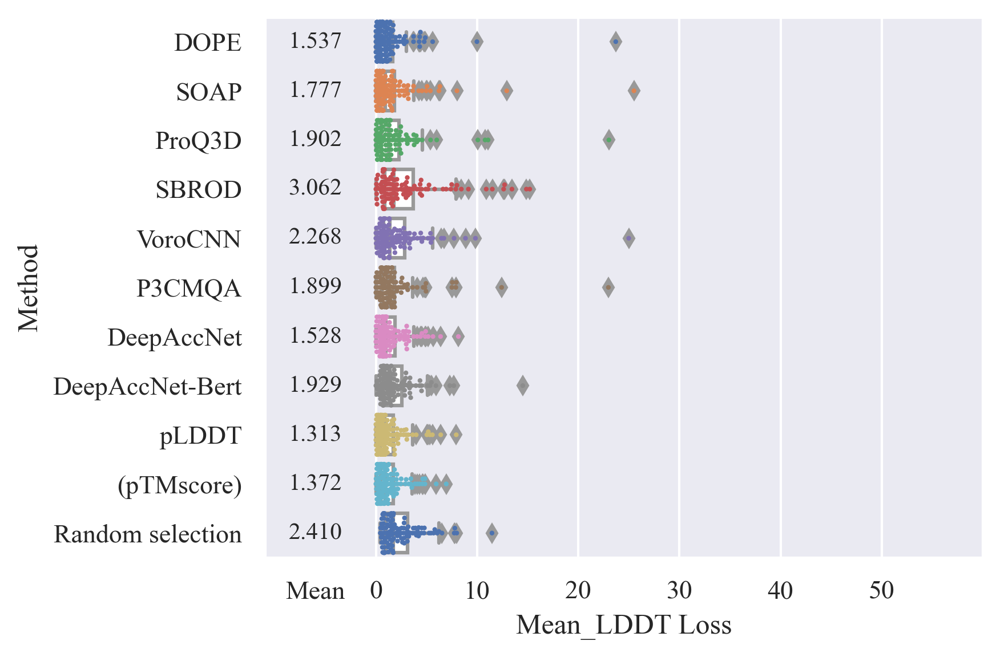

In [27]:
label = 'Mean_LDDT'
metric = 'Loss'
sns.boxplot(data=result_each_target, x=f'{label} {metric}', y=f'Method', order=methods + ['Random selection'], color='white')
sns.swarmplot(data=result_each_target, x=f'{label} {metric}', y=f'Method', order=methods + ['Random selection'], size=2, palette='deep')
xticks = np.arange(-1, 6) * 10
xticks_start = -6
xticks[0] = xticks_start
xticks_str = xticks.astype(str)
xticks_str[0] = 'Mean'
plt.xlim(-11, 60)
plt.xticks(xticks, xticks_str)
plt.axvline(x=xticks_start, color=(234/255,234/255,242/255))
# put parentheses around the pTMscore
yticks, yticks_texts = plt.yticks()
for i, ytick_text in enumerate(yticks_texts):
    if ytick_text.get_text() == 'pTMscore':
        yticks_texts[i] = '(pTMscore)'
plt.yticks(yticks, yticks_texts)
for i, method in enumerate(methods + ['Random selection']):
    value = result_df.query('Method == @method')[f'{label} {metric}'].values[0]
    plt.text(xticks_start, i, f'{value:.3f}', size=10, horizontalalignment='center', verticalalignment='center')
plt.tight_layout()
plt.savefig(fig_dir / f'boxplot_{label}_{metric}.png')

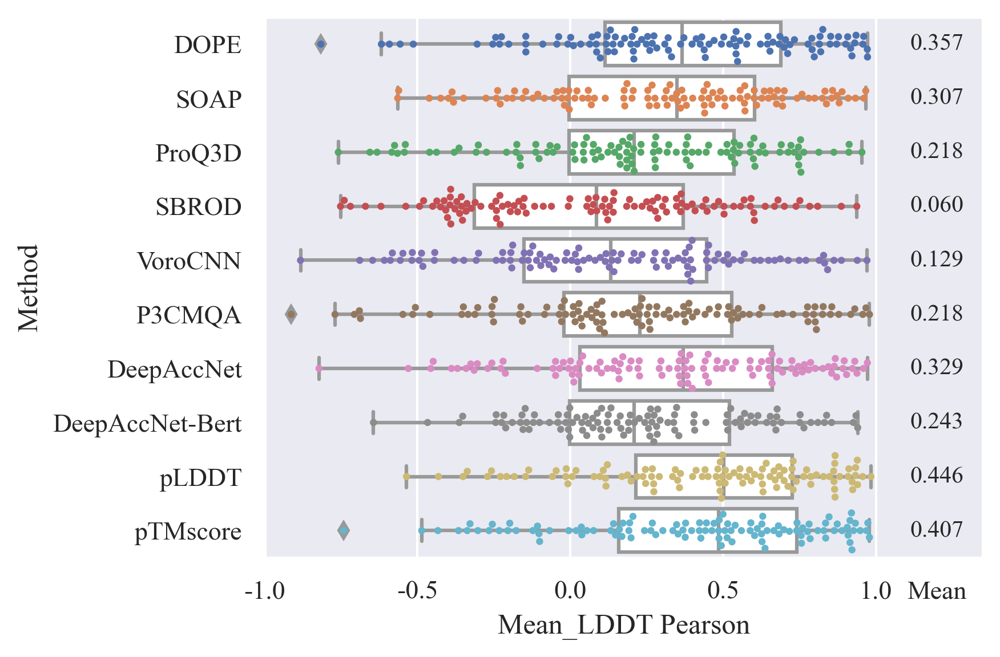

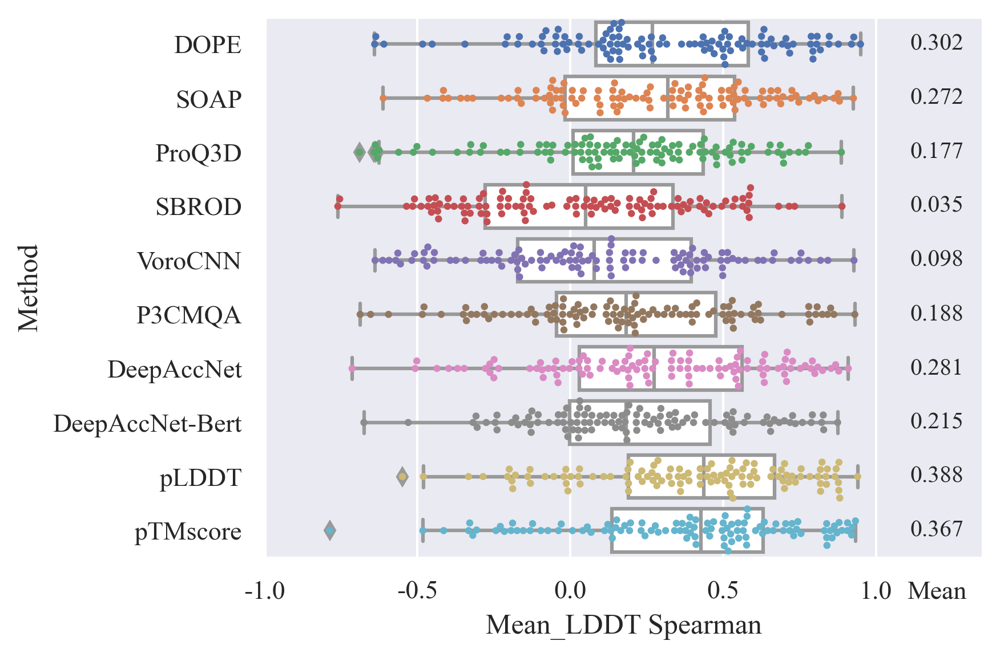

In [28]:
metrics = ['Pearson', 'Spearman']
data = result_each_target
label = 'Mean_LDDT'
y = 'Method'
for metric in metrics:
    x = f'{label} {metric}'
    sns.boxplot(data=data, x=x, y=y, order=methods, color='white')
    sns.swarmplot(data=data, x=x, y=y, order=methods, size=3)
    xticks_max = 1.2
    plt.xlim(-1, 1.35)
    xticks = np.append(np.arange(-1.0, 1.2, 0.5), [xticks_max])
    xticks_str = list(map(lambda x: f'{x:.1f}', xticks))
    xticks_str[-1] = 'Mean'
    plt.xticks(xticks, xticks_str)
    plt.axvline(x=xticks_max, color=(234/255,234/255,242/255))
    mean_series = data.groupby(y).mean()[x]
    for i, method in enumerate(methods):
        value = mean_series[method]
        plt.text(xticks_max, i, f'{value:.3f}', size=10, horizontalalignment='center', verticalalignment='center')
    plt.tight_layout()
    plt.savefig(fig_dir / f'boxplot_{label}_{metric}.png')
    plt.show()

### Error between MQA methods and labels

In [29]:
label = 'GDT_TS'
score = 'pLDDT'
error = df[score] - df[label]
error

0        -0.025
1        -0.022
2        -0.037
3        -0.031
4        -0.030
          ...  
108595   -0.106
108596   -0.105
108597   -0.106
108598   -0.106
108599   -0.106
Length: 108600, dtype: float64

/Users/TAKEI/miniforge3/envs/mypython/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

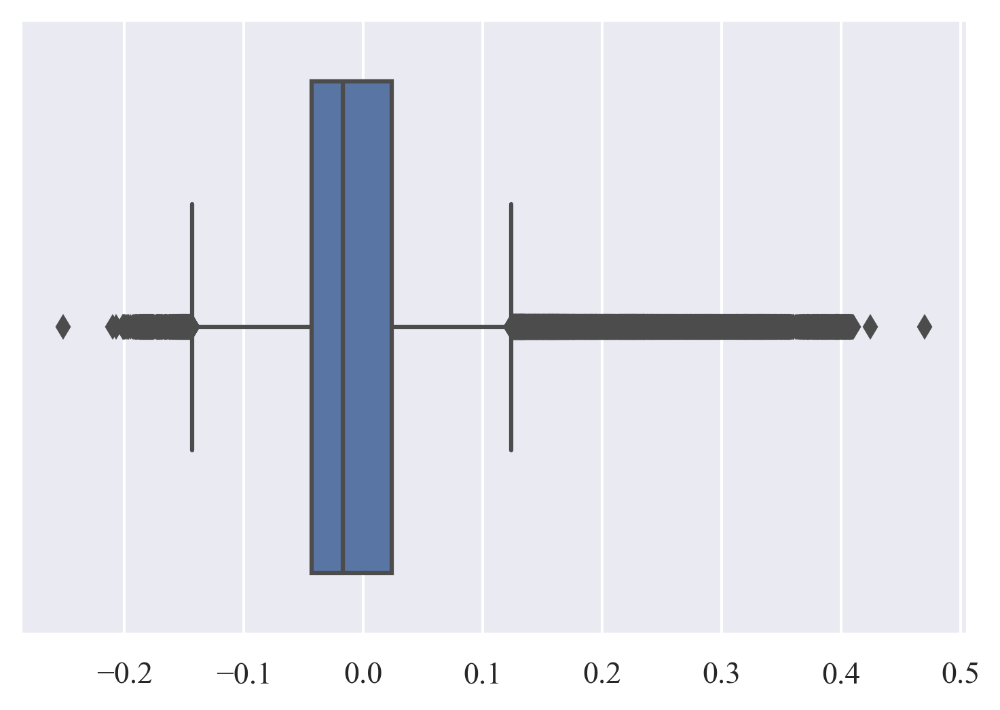

In [30]:
sns.boxplot(error)

## Scatter plot between labels and MQA methods

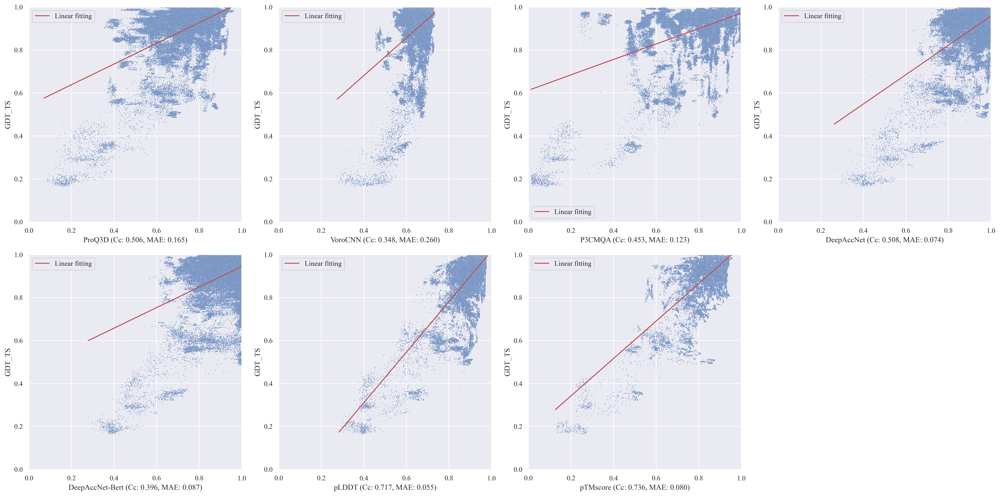

In [31]:
# GDT_TS
nrows = 2
ncols = 4
figsize = (22, 11)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, sharex=False, sharey=False, figsize=figsize)
label = 'GDT_TS'
ms = ['ProQ3D', 'VoroCNN', 'P3CMQA', 'DeepAccNet', 'DeepAccNet-Bert', 'pLDDT', 'pTMscore']
data = df
for i, method in enumerate(ms):
    ax = axes[i // ncols, i % ncols]
    sns.scatterplot(data=data, x=method, y=label, s=1, ax=axes[i // ncols, i % ncols])
    d = data[~data[method].isna()]
    x = d[method]
    y = d[label]
    corr = d.corr()[method][label]
    mae = mean_absolute_error(x, y)
    ax.set_xlabel(f'{method} (Cc: {corr:.3f}, MAE: {mae:.3f})')
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    x_latent = np.linspace(x.min(), x.max(), 100)
    a, b = np.polyfit(x, y, 1)
    y_latent = a * x_latent + b
    ax.plot(x_latent, y_latent, 'r-')
    ax.legend(['Linear fitting'])
for i in range(len(ms), ncols * nrows):
    ax = axes[i // ncols, i % ncols]
    ax.axis('off')
plt.tight_layout()
plt.savefig(fig_dir / f'scatterplot_methods_{label}.png')
plt.show()

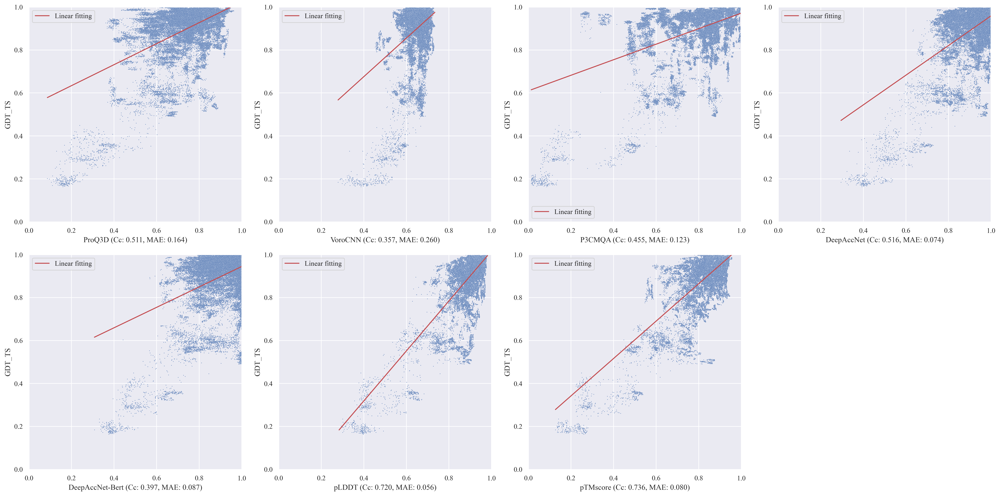

In [32]:
# GDT_TS with pTMscore
nrows = 2
ncols = 4
figsize = (22, 11)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, sharex=False, sharey=False, figsize=figsize)
label = 'GDT_TS'
ms = ['ProQ3D', 'VoroCNN', 'P3CMQA', 'DeepAccNet', 'DeepAccNet-Bert', 'pLDDT', 'pTMscore']
data = df[~df['pTMscore'].isna()]
for i, method in enumerate(ms):
    ax = axes[i // ncols, i % ncols]
    sns.scatterplot(data=data, x=method, y=label, s=1, ax=axes[i // ncols, i % ncols])
    d = data[~data[method].isna()]
    x = d[method]
    y = d[label]
    corr = d.corr()[method][label]
    mae = mean_absolute_error(x, y)
    ax.set_xlabel(f'{method} (Cc: {corr:.3f}, MAE: {mae:.3f})')
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    x_latent = np.linspace(x.min(), x.max(), 100)
    a, b = np.polyfit(x, y, 1)
    y_latent = a * x_latent + b
    ax.plot(x_latent, y_latent, 'r-')
    ax.legend(['Linear fitting'])
for i in range(len(ms), ncols * nrows):
    ax = axes[i // ncols, i % ncols]
    ax.axis('off')
plt.tight_layout()
plt.savefig(fig_dir / f'scatterplot_methods_{label}_with_ptm.png')
plt.show()

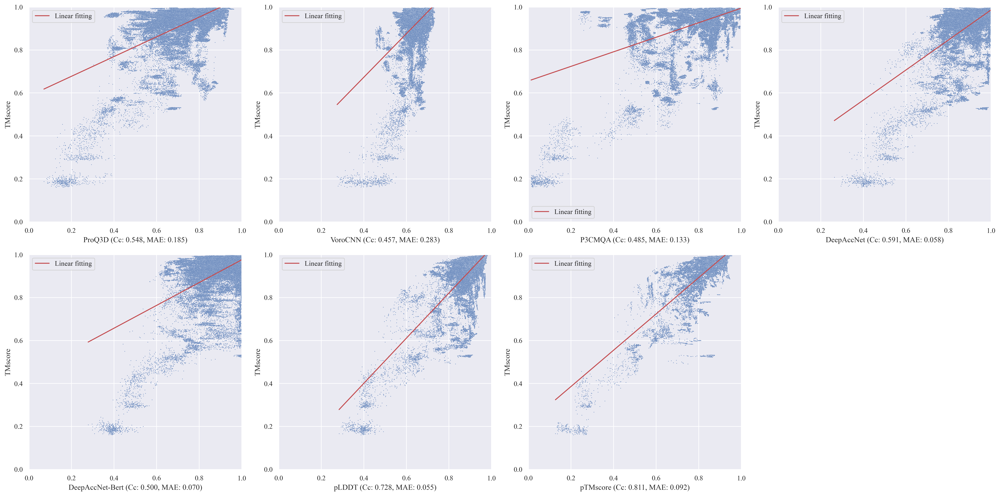

In [33]:
# TMscore
nrows = 2
ncols = 4
figsize = (22, 11)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, sharex=False, sharey=False, figsize=figsize)
label = 'TMscore'
ms = ['ProQ3D', 'VoroCNN', 'P3CMQA', 'DeepAccNet', 'DeepAccNet-Bert', 'pLDDT', 'pTMscore']
data = df
for i, method in enumerate(ms):
    ax = axes[i // ncols, i % ncols]
    sns.scatterplot(data=data, x=method, y=label, s=1, ax=axes[i // ncols, i % ncols])
    d = data[~data[method].isna()]
    x = d[method]
    y = d[label]
    corr = d.corr()[method][label]
    mae = mean_absolute_error(y, x)
    ax.set_xlabel(f'{method} (Cc: {corr:.3f}, MAE: {mae:.3f})')
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    x_latent = np.linspace(x.min(), x.max(), 100)
    a, b = np.polyfit(x, y, 1)
    y_latent = a * x_latent + b
    ax.plot(x_latent, y_latent, 'r-')
    ax.legend(['Linear fitting'])
for i in range(len(ms), ncols * nrows):
    ax = axes[i // ncols, i % ncols]
    ax.axis('off')
plt.tight_layout()
plt.savefig(fig_dir / f'scatterplot_methods_{label}.png')
plt.show()

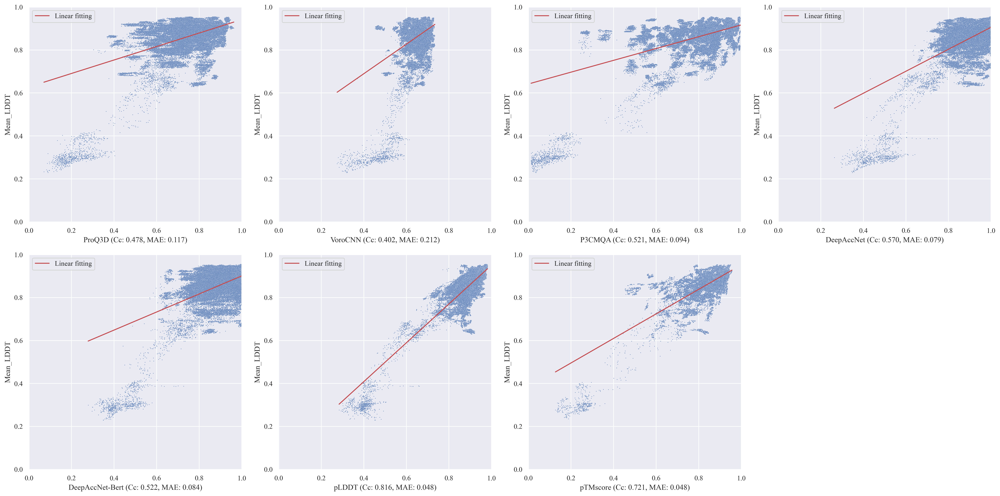

In [34]:
# Mean LDDT
nrows = 2
ncols = 4
figsize = (22, 11)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, sharex=False, sharey=False, figsize=figsize)
label = 'Mean_LDDT'
ms = ['ProQ3D', 'VoroCNN', 'P3CMQA', 'DeepAccNet', 'DeepAccNet-Bert', 'pLDDT', 'pTMscore']
data = df[~df[label].isna()]
for i, method in enumerate(ms):
    ax = axes[i // ncols, i % ncols]
    sns.scatterplot(data=data, x=method, y=label, s=1, ax=axes[i // ncols, i % ncols])
    d = data[~data[method].isna()]
    x = d[method]
    y = d[label]
    corr = d.corr()[method][label]
    mae = mean_absolute_error(x, y)
    ax.set_xlabel(f'{method} (Cc: {corr:.3f}, MAE: {mae:.3f})')
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    x_latent = np.linspace(x.min(), x.max(), 100)
    a, b = np.polyfit(x, y, 1)
    y_latent = a * x_latent + b
    ax.plot(x_latent, y_latent, 'r-')
    ax.legend(['Linear fitting'])
for i in range(len(ms), ncols * nrows):
    ax = axes[i // ncols, i % ncols]
    ax.axis('off')
plt.tight_layout()
plt.savefig(fig_dir / f'scatterplot_methods_{label}.png')
plt.show()